Get the data

In [1]:
import torch
from torchvision import models
from torchvision import transforms

In [2]:
from timeit import default_timer as timer
from typing import Tuple, Dict
import random
from pathlib import Path
import matplotlib.pyplot as plt

In [3]:
# Import/install Gradio
try:
    import gradio as gr
except:
    !pip -q install gradio
    import gradio as gr

print(f"Gradio version: {gr.__version__}")

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
botocore 1.34.154 requires urllib3<1.27,>=1.25.4; python_version < "3.10", but you have urllib3 2.3.0 which is incompatible.
spyder 5.2.2 requires pyqt5<5.13, but you have pyqt5 5.15.10 which is incompatible.
spyder 5.2.2 requires pyqtwebengine<5.13, but you have pyqtwebengine 5.15.6 which is incompatible.


Gradio version: 4.44.1


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [80]:
# !rm -rf /content/E-Waste-Images

In [82]:
import os
import shutil

repo_url = "https://github.com/Pseudophoenix/E-Waste-Images.git"
repo_name = "E-Waste-Images"

# Check if the directory exists
if os.path.exists(repo_name):
    # Remove the existing directory
    shutil.rmtree(repo_name)

# Clone the repository
!git clone {repo_url}


Cloning into 'E-Waste-Images'...
remote: Enumerating objects: 3867, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 3867 (delta 4), reused 14 (delta 4), pack-reused 3850 (from 1)
Receiving objects: 100% (3867/3867), 80.11 MiB | 12.68 MiB/s, done.
Resolving deltas: 100% (34/34), done.
Updating files: 100% (7836/7836), done.


In [43]:
# # Replace the URL with the URL of your GitHub repository
# try:
#   !git clone https://github.com/Pseudophoenix/E-Waste-Images.git
# except:
#   !rm -rf E-Waste-Images/
#   !git clone https://github.com/Pseudophoenix/E-Waste-Images.git

fatal: destination path 'E-Waste-Images' already exists and is not an empty directory.


Divide the data into training and testing set


Load into dataloaders.....perform data augmentation, go for normalization and scaling...like all image should be of same size....then the size of image be `X` then `X` will be the value of in_features....Make changes according to the Pretrained model's parameters and `dataloaders`....get the model


Trying the `efficientnet_b0` model with 4 classes

In [5]:
model = models.efficientnet_b0(pretrained=True)

c:\Users\alok4\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\alok4\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to C:\Users\alok4/.cache\torch\hub\checkpoints\efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:05<00:00, 3.81MB/s]


In [6]:
# Move the model to GPU if available
model = model.to(device)
# model.device

In [5]:
# model

In [8]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms

# Define data transformations for EfficientNet-B0
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # EfficientNet-B0 default input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


# Load datasets
train_dataset = ImageFolder('/content/E-Waste-Images/output_dataset/train', transform=train_transforms)
val_dataset = ImageFolder('/content/E-Waste-Images/output_dataset/train', transform=val_transforms)

# train_dataset.to(device)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


In [30]:
# Classes in the dataset
print(f"Classes: {train_dataset.classes}")

Classes: ['Battery', 'Keyboard', 'Microwave', 'Mobile']


In [33]:
class_names=train_dataset.classes
class_names

['Battery', 'Keyboard', 'Microwave', 'Mobile']

In [35]:
num_classes=len(class_names)
num_classes

4

In [ ]:
model.classifier[1]=torch.nn.Linear(model.classifier[1].in_features,num_classes)

In [17]:
# Display some sample images
def imshow(img):
    img = img / 2 + 0.5  # Unnormalize
    plt.imshow(img.permute(1, 2, 0))
    plt.show()

In [ ]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Show the first image in the batch
imshow(images[1])
print(f"Label: {train_dataset.classes[labels[1]]}")

In [12]:
# train_loader.to(device)
# val_loader.to(device)

In [ ]:
import torch.nn as nn
import torch.optim as optim

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

Label: Battery


Training the model with 3, 4 epoch

In [ ]:
from tqdm import tqdm

# Training loop
epochs = 3
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        model=model.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader)}")

    # Validation
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f"Validation Accuracy: {100 * correct / total:.2f}%")


100%|██████████| 38/38 [00:10<00:00,  3.54it/s]


Epoch 1/3, Loss: 0.9606707268639615
Validation Accuracy: 96.46%


100%|██████████| 38/38 [00:10<00:00,  3.79it/s]


Epoch 2/3, Loss: 0.2974718591492427
Validation Accuracy: 99.16%


100%|██████████| 38/38 [00:08<00:00,  4.41it/s]


Epoch 3/3, Loss: 0.12160547028638814
Validation Accuracy: 99.75%


Model's weights, biases and parameters

In [10]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2156e-01,  6.5634e-01,  4.5671e-01],
                        [-1.1092e-01, -6.1004e-01, -3.3345e-01],
                        [ 2.7964e-02, -1.0312e-01, -1.0324e-01]],
              
                       [[ 6.3553e-02,  1.6552e+00,  1.7436e+00],
                        [-1.3646e-01, -1.5367e+00, -1.5937e+00],
                        [ 5.0196e-02, -1.1360e-01, -1.2600e-01]],
              
                       [[ 8.7276e-02,  3.6126e-01,  2.6946e-01],
                        [-1.1966e-01, -2.8122e-01, -2.1883e-01],
                        [ 3.6658e-02, -7.0751e-02, -8.1917e-02]]],
              
              
                      [[[ 1.6449e-01, -2.0041e-01,  8.3092e-02],
                        [ 8.9009e-01, -1.2110e+00,  2.7610e-01],
                        [ 1.0740e+00, -1.2603e+00,  2.0645e-01]],
              
                       [[ 3.2816e-01, -4.3449e-01,  1.8769e-01],
                        [ 1.6213e+00, 

The `.state_dict()` of a model contains all the learnable parameters (weights and biases) and buffers. It does not include the model architecture itself. Therefore, when you load the model, you need to define its architecture first.

Saving the model

In [ ]:
torch.save(model.state_dict(), 'E-Waste-Images/efficientnet_b4_e_waste_ep_3_4_classes.pth')

Dwonloading the model from the Colab

In [ ]:
from google.colab import files

# Specify the path to the file you want to download
file_path = "efficientnet_b4_e_waste_ep_3_4_classes.pth"

# Download the file
files.download(file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [15]:
# Put EffNetB2 on CPU
model.to("cpu")

# Check the device
next(iter(model.parameters())).device

device(type='cpu')

In [ ]:
def predict(img) -> Tuple[Dict, float]:
    """Transforms and performs a prediction on img and returns prediction and time taken.
    """
    # Start the timer
    start_time = timer()

    # Transform the target image and add a batch dimension
    img = val_transforms(img).unsqueeze(0)
    # img.to(device)
    # Put model into evaluation mode and turn on inference mode
    model.eval()
    with torch.inference_mode():
        # Pass the transformed image through the model and turn the prediction logits into prediction probabilities
        pred_probs = torch.softmax(model(img), dim=1)

    # Create a prediction label and prediction probability dictionary for each prediction class (this is the required format for Gradio's output parameter)
    pred_labels_and_probs = {class_names[i]: float(pred_probs[0][i]) for i in range(len(class_names))}

    # Calculate the prediction time
    pred_time = round(timer() - start_time, 5)

    # Return the prediction dictionary and prediction time
    return pred_labels_and_probs, pred_time

In [ ]:
# Get a list of all test image filepaths
test_data_paths = list(Path("/").glob("*/*.jpeg"))
test_data_paths

[PosixPath('/content/2images.jpeg'), PosixPath('/content/images.jpeg')]

In [ ]:
# Create a list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=2)]
example_list

[['/content/images.jpeg'], ['/content/2images.jpeg']]

In [ ]:
import gradio as gr

# Create title, description and article strings
title = "E-Waste 🍕🥩🍣"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of food as pizza, steak or sushi."
article = "Created at [09. PyTorch Model Deployment](https://www.learnpytorch.io/09_pytorch_model_deployment/)."

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=4, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=True, # print errors locally?
            share=True) # generate a publically shareable URL?

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://d4f61add5d8add2d4c.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7864 <> https://d4f61add5d8add2d4c.gradio.live


## Loading the weigths into the model


In [11]:
model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b4_e_waste_ep_3_4_classes.pth'))

<ipython-input-11-75c33667d823>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b4_e_wa

<All keys matched successfully>

In [12]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2293e-01,  6.5816e-01,  4.5867e-01],
                        [-1.0952e-01, -6.0823e-01, -3.3147e-01],
                        [ 2.9242e-02, -1.0143e-01, -1.0132e-01]],
              
                       [[ 6.5037e-02,  1.6572e+00,  1.7457e+00],
                        [-1.3495e-01, -1.5346e+00, -1.5915e+00],
                        [ 5.1621e-02, -1.1168e-01, -1.2387e-01]],
              
                       [[ 8.9169e-02,  3.6368e-01,  2.7204e-01],
                        [-1.1773e-01, -2.7879e-01, -2.1624e-01],
                        [ 3.8516e-02, -6.8409e-02, -7.9381e-02]]],
              
              
                      [[[ 1.6451e-01, -2.0043e-01,  8.3025e-02],
                        [ 8.9006e-01, -1.2110e+00,  2.7599e-01],
                        [ 1.0738e+00, -1.2605e+00,  2.0616e-01]],
              
                       [[ 3.2789e-01, -4.3479e-01,  1.8735e-01],
                        [ 1.6210e+00, 

In [17]:
# Put EffNetB2 on CPU
model.to("cpu")

# Check the device
next(iter(model.parameters())).device

device(type='cpu')

In [18]:
def predict(img) -> Tuple[Dict, float]:
    """Transforms and performs a prediction on img and returns prediction and time taken.
    """
    # Start the timer
    start_time = timer()

    # Transform the target image and add a batch dimension
    img = val_transforms(img).unsqueeze(0)
    # img.to(device)
    # Put model into evaluation mode and turn on inference mode
    model.eval()
    with torch.inference_mode():
        # Pass the transformed image through the model and turn the prediction logits into prediction probabilities
        pred_probs = torch.softmax(model(img), dim=1)

    # Create a prediction label and prediction probability dictionary for each prediction class (this is the required format for Gradio's output parameter)
    pred_labels_and_probs = {class_names[i]: float(pred_probs[0][i]) for i in range(len(class_names))}

    # Calculate the prediction time
    pred_time = round(timer() - start_time, 5)

    # Return the prediction dictionary and prediction time
    return pred_labels_and_probs, pred_time

In [24]:
# Get a list of all test image filepaths
test_data_paths = list(Path("/content/E-Waste-Images/").glob("*/*.jpeg"))
test_data_paths

[PosixPath('/content/E-Waste-Images/examples/1images.jpeg'),
 PosixPath('/content/E-Waste-Images/examples/2images.jpeg')]

In [25]:
# Create a list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=2)]
example_list

[['/content/E-Waste-Images/examples/1images.jpeg'],
 ['/content/E-Waste-Images/examples/2images.jpeg']]

In [27]:
import gradio as gr

# Create title, description and article strings
title = "E-Waste 🍕🥩🍣"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of food as pizza, steak or sushi."
article = "Created at [09. PyTorch Model Deployment](https://www.learnpytorch.io/09_pytorch_model_deployment/)."

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=4, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=True, # print errors locally?
            share=True) # generate a publically shareable URL?

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://97bea147f5397dbaa9.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://97bea147f5397dbaa9.gradio.live


## Trying the `efficientnet_b0` model with 7 classes and 11 epochs

In [50]:
model = models.efficientnet_b0(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [51]:
# Move the model to GPU if available
model = model.to(device)
# model.device

In [52]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms

# Define data transformations for EfficientNet-B0
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # EfficientNet-B0 default input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


# Load datasets
train_dataset = ImageFolder('/content/E-Waste-Images/output_dataset/train', transform=train_transforms)
val_dataset = ImageFolder('/content/E-Waste-Images/output_dataset/train', transform=val_transforms)

# train_dataset.to(device)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


In [53]:
# Classes in the dataset
print(f"Classes: {train_dataset.classes}")

Classes: ['Battery', 'Keyboard', 'Microwave', 'Mobile', 'Printer', 'Television', 'Washing Machine']


In [54]:
class_names=train_dataset.classes
class_names

['Battery',
 'Keyboard',
 'Microwave',
 'Mobile',
 'Printer',
 'Television',
 'Washing Machine']

In [55]:
num_classes=len(class_names)
num_classes

7

In [56]:
model.classifier[1]=torch.nn.Linear(model.classifier[1].in_features,num_classes)

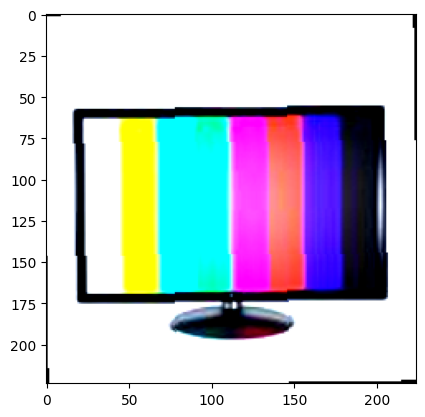

Label: Television


In [57]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Show the first image in the batch
imshow(images[1])
print(f"Label: {train_dataset.classes[labels[1]]}")

In [ ]:
# train_loader.to(device)
# val_loader.to(device)

In [58]:
import torch.nn as nn
import torch.optim as optim

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

Training the model with 3, 8 epoch

In [60]:
from tqdm import tqdm

# Training loop
epochs = 8
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        model=model.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader)}")

    # Validation
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f"Validation Accuracy: {100 * correct / total:.2f}%")


100%|██████████| 72/72 [00:18<00:00,  3.83it/s]


Epoch 1/8, Loss: 0.10147973434585664
Validation Accuracy: 99.65%


100%|██████████| 72/72 [00:18<00:00,  3.81it/s]


Epoch 2/8, Loss: 0.07106491330260825
Validation Accuracy: 99.91%


100%|██████████| 72/72 [00:18<00:00,  3.81it/s]


Epoch 3/8, Loss: 0.04795580864366558
Validation Accuracy: 99.91%


100%|██████████| 72/72 [00:18<00:00,  3.80it/s]


Epoch 4/8, Loss: 0.037647850669196084
Validation Accuracy: 99.96%


100%|██████████| 72/72 [00:18<00:00,  3.90it/s]


Epoch 5/8, Loss: 0.03470372369823357
Validation Accuracy: 100.00%


100%|██████████| 72/72 [00:18<00:00,  3.91it/s]


Epoch 6/8, Loss: 0.027280532638542354
Validation Accuracy: 100.00%


100%|██████████| 72/72 [00:18<00:00,  3.84it/s]


Epoch 7/8, Loss: 0.026703111709341303
Validation Accuracy: 100.00%


100%|██████████| 72/72 [00:18<00:00,  3.82it/s]


Epoch 8/8, Loss: 0.024249126673870098
Validation Accuracy: 100.00%


Model's weights, biases and parameters

In [61]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2196e-01,  6.5558e-01,  4.5557e-01],
                        [-1.1054e-01, -6.1074e-01, -3.3457e-01],
                        [ 2.8167e-02, -1.0413e-01, -1.0477e-01]],
              
                       [[ 6.4772e-02,  1.6553e+00,  1.7433e+00],
                        [-1.3526e-01, -1.5365e+00, -1.5939e+00],
                        [ 5.1198e-02, -1.1373e-01, -1.2667e-01]],
              
                       [[ 8.9516e-02,  3.6245e-01,  2.7029e-01],
                        [-1.1744e-01, -2.7997e-01, -2.1801e-01],
                        [ 3.8664e-02, -6.9822e-02, -8.1515e-02]]],
              
              
                      [[[ 1.6447e-01, -2.0040e-01,  8.3031e-02],
                        [ 8.9051e-01, -1.2106e+00,  2.7618e-01],
                        [ 1.0748e+00, -1.2595e+00,  2.0695e-01]],
              
                       [[ 3.2934e-01, -4.3330e-01,  1.8880e-01],
                        [ 1.6229e+00, 

The `.state_dict()` of a model contains all the learnable parameters (weights and biases) and buffers. It does not include the model architecture itself. Therefore, when you load the model, you need to define its architecture first.

Saving the model

In [63]:
torch.save(model.state_dict(), '/content/E-Waste-Images/model_weights/efficientnet_b4_e_waste_ep_11_7_classes.pth')

Dwonloading the model from the Colab

In [64]:
from google.colab import files

# Specify the path to the file you want to download
file_path = "/content/E-Waste-Images/model_weights/efficientnet_b4_e_waste_ep_11_7_classes.pth"

# Download the file
files.download(file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

## Loading the weigths into the model


In [68]:
model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b4_e_waste_ep_11_7_classes.pth'))

<ipython-input-68-c3832b20760d>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b4_e_wa

<All keys matched successfully>

In [69]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2196e-01,  6.5558e-01,  4.5557e-01],
                        [-1.1054e-01, -6.1074e-01, -3.3457e-01],
                        [ 2.8167e-02, -1.0413e-01, -1.0477e-01]],
              
                       [[ 6.4772e-02,  1.6553e+00,  1.7433e+00],
                        [-1.3526e-01, -1.5365e+00, -1.5939e+00],
                        [ 5.1198e-02, -1.1373e-01, -1.2667e-01]],
              
                       [[ 8.9516e-02,  3.6245e-01,  2.7029e-01],
                        [-1.1744e-01, -2.7997e-01, -2.1801e-01],
                        [ 3.8664e-02, -6.9822e-02, -8.1515e-02]]],
              
              
                      [[[ 1.6447e-01, -2.0040e-01,  8.3031e-02],
                        [ 8.9051e-01, -1.2106e+00,  2.7618e-01],
                        [ 1.0748e+00, -1.2595e+00,  2.0695e-01]],
              
                       [[ 3.2934e-01, -4.3330e-01,  1.8880e-01],
                        [ 1.6229e+00, 

In [70]:
# Put EffNetB2 on CPU
model.to("cpu")

# Check the device
next(iter(model.parameters())).device

device(type='cpu')

In [71]:
# Get a list of all test image filepaths
test_data_paths = list(Path("/").glob("*/*.jpeg"))
test_data_paths

[]

In [72]:
# Create a list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=0)]
example_list

[]

In [75]:
import gradio as gr

# Create title, description and article strings
title = "E-Waste 🍕🥩🍣"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of food as pizza, steak or sushi."
article = "Created at [09. PyTorch Model Deployment](https://www.learnpytorch.io/09_pytorch_model_deployment/)."

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=7, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=True, # print errors locally?
            share=True) # generate a publically shareable URL?

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://fff5d3868ff363bfad.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://fff5d3868ff363bfad.gradio.live


## Trying the `efficientnet_b0` model with 10 classes and 15 epochs

In [7]:
model = models.efficientnet_b0(pretrained=True)

In [8]:
# Move the model to GPU if available
model = model.to(device)
# model.device

In [11]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms

# Define data transformations for EfficientNet-B0
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # EfficientNet-B0 default input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


# Load datasets
train_dataset = ImageFolder('output_dataset/train', transform=train_transforms)
val_dataset = ImageFolder('output_dataset/train', transform=val_transforms)

# train_dataset.to(device)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


In [12]:
# Classes in the dataset
print(f"Classes: {train_dataset.classes}")

Classes: ['Battery', 'Keyboard', 'Microwave', 'Mobile', 'Mouse', 'PCB', 'Player', 'Printer', 'Television', 'Washing Machine']


In [13]:
class_names=train_dataset.classes
class_names

['Battery',
 'Keyboard',
 'Microwave',
 'Mobile',
 'Mouse',
 'PCB',
 'Player',
 'Printer',
 'Television',
 'Washing Machine']

In [14]:
num_classes=len(class_names)
num_classes

10

In [15]:
model.classifier[1]=torch.nn.Linear(model.classifier[1].in_features,num_classes)

In [ ]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Show the first image in the batch
imshow(images[7])
print(f"Label: {train_dataset.classes[labels[7]]}")

In [94]:
# train_loader.to(device)
# val_loader.to(device)

In [95]:
import torch.nn as nn
import torch.optim as optim

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

Training the model with 15 epoch

In [96]:
from tqdm import tqdm

# Training loop
epochs = 15
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        model=model.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader)}")

    # Validation
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f"Validation Accuracy: {100 * correct / total:.2f}%")


100%|██████████| 99/99 [00:26<00:00,  3.75it/s]


Epoch 1/15, Loss: 1.4353539871447014
Validation Accuracy: 93.65%


100%|██████████| 99/99 [00:26<00:00,  3.81it/s]


Epoch 2/15, Loss: 0.3778490282670416
Validation Accuracy: 97.75%


100%|██████████| 99/99 [00:26<00:00,  3.80it/s]


Epoch 3/15, Loss: 0.19566756885762165
Validation Accuracy: 98.98%


100%|██████████| 99/99 [00:25<00:00,  3.82it/s]


Epoch 4/15, Loss: 0.12263464489293219
Validation Accuracy: 99.56%


100%|██████████| 99/99 [00:26<00:00,  3.78it/s]


Epoch 5/15, Loss: 0.08121155360431383
Validation Accuracy: 99.90%


100%|██████████| 99/99 [00:26<00:00,  3.76it/s]


Epoch 6/15, Loss: 0.06293851544967655
Validation Accuracy: 99.90%


100%|██████████| 99/99 [00:25<00:00,  3.85it/s]


Epoch 7/15, Loss: 0.0462107405471004
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.83it/s]


Epoch 8/15, Loss: 0.04136264757394339
Validation Accuracy: 99.94%


100%|██████████| 99/99 [00:25<00:00,  3.83it/s]


Epoch 9/15, Loss: 0.02787723011252555
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:26<00:00,  3.81it/s]


Epoch 10/15, Loss: 0.03456653094841073
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.85it/s]


Epoch 11/15, Loss: 0.022804987635651624
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.82it/s]


Epoch 12/15, Loss: 0.025520133762385207
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.84it/s]


Epoch 13/15, Loss: 0.019203846880253592
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.84it/s]


Epoch 14/15, Loss: 0.01885194284077075
Validation Accuracy: 100.00%


100%|██████████| 99/99 [00:25<00:00,  3.84it/s]


Epoch 15/15, Loss: 0.016457995945456053
Validation Accuracy: 99.94%


Model's weights, biases and parameters

In [97]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2260e-01,  6.5678e-01,  4.5696e-01],
                        [-1.1013e-01, -6.0977e-01, -3.3325e-01],
                        [ 2.8789e-02, -1.0273e-01, -1.0287e-01]],
              
                       [[ 6.3884e-02,  1.6548e+00,  1.7429e+00],
                        [-1.3629e-01, -1.5371e+00, -1.5943e+00],
                        [ 5.0483e-02, -1.1375e-01, -1.2580e-01]],
              
                       [[ 8.7595e-02,  3.6098e-01,  2.6921e-01],
                        [-1.1960e-01, -2.8167e-01, -2.1917e-01],
                        [ 3.6776e-02, -7.0962e-02, -8.1952e-02]]],
              
              
                      [[[ 1.6431e-01, -2.0058e-01,  8.3010e-02],
                        [ 8.8901e-01, -1.2121e+00,  2.7468e-01],
                        [ 1.0728e+00, -1.2616e+00,  2.0467e-01]],
              
                       [[ 3.2816e-01, -4.3447e-01,  1.8781e-01],
                        [ 1.6204e+00, 

The `.state_dict()` of a model contains all the learnable parameters (weights and biases) and buffers. It does not include the model architecture itself. Therefore, when you load the model, you need to define its architecture first.

Saving the model

In [98]:
torch.save(model.state_dict(), '/content/E-Waste-Images/model_weights/efficientnet_b0_e_waste_ep_15_10_classes.pth')

Dwonloading the model from the Colab

In [99]:
from google.colab import files

# Specify the path to the file you want to download
file_path = "/content/E-Waste-Images/model_weights/efficientnet_b0_e_waste_ep_15_10_classes.pth"

# Download the file
files.download(file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [100]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

## Loading the weigths into the model


In [101]:
model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b0_e_waste_ep_15_10_classes.pth'))

<ipython-input-101-0e5f1140213f>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/E-Waste-Images/model_weights/efficientnet_b0_e_w

<All keys matched successfully>

In [102]:
model.state_dict()

OrderedDict([('features.0.0.weight',
              tensor([[[[ 1.2260e-01,  6.5678e-01,  4.5696e-01],
                        [-1.1013e-01, -6.0977e-01, -3.3325e-01],
                        [ 2.8789e-02, -1.0273e-01, -1.0287e-01]],
              
                       [[ 6.3884e-02,  1.6548e+00,  1.7429e+00],
                        [-1.3629e-01, -1.5371e+00, -1.5943e+00],
                        [ 5.0483e-02, -1.1375e-01, -1.2580e-01]],
              
                       [[ 8.7595e-02,  3.6098e-01,  2.6921e-01],
                        [-1.1960e-01, -2.8167e-01, -2.1917e-01],
                        [ 3.6776e-02, -7.0962e-02, -8.1952e-02]]],
              
              
                      [[[ 1.6431e-01, -2.0058e-01,  8.3010e-02],
                        [ 8.8901e-01, -1.2121e+00,  2.7468e-01],
                        [ 1.0728e+00, -1.2616e+00,  2.0467e-01]],
              
                       [[ 3.2816e-01, -4.3447e-01,  1.8781e-01],
                        [ 1.6204e+00, 

In [103]:
# Put EffNetB2 on CPU
model.to("cpu")

# Check the device
next(iter(model.parameters())).device

device(type='cpu')

In [104]:
# Get a list of all test image filepaths
test_data_paths = list(Path("/").glob("*/*.jpeg"))
test_data_paths

[]

In [105]:
# Create a list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=0)]
example_list

[]

In [ ]:
import gradio as gr

# Create title, description and article strings
title = "E-Waste 🍕🥩🍣"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of food as pizza, steak or sushi."
article = "Created at [09. PyTorch Model Deployment](https://www.learnpytorch.io/09_pytorch_model_deployment/)."

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=10, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=True, # print errors locally?
            share=True) # generate a publically shareable URL?

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://217945288707c01a0d.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
